In [1]:
from google.colab import files
files.upload()

Saving US Superstore data.xls to US Superstore data.xls


{'US Superstore data.xls': b'\xd0\xcf\x11\xe0\xa1\xb1\x1a\xe1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x03\x00\xfe\xff\t\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00s\x19\x00\x00\x01\x00\x00\x00\xfe\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\xe3\x00\x00\x00d\x01\x00\x00\xe5\x01\x00\x00f\x02\x00\x00\xe7\x02\x00\x00h\x03\x00\x00\xe9\x03\x00\x00j\x04\x00\x00\xeb\x04\x00\x00l\x05\x00\x00\xed\x05\x00\x00n\x06\x00\x00\xef\x06\x00\x00p\x07\x00\x00\xf1\x07\x00\x00r\x08\x00\x00\xf3\x08\x00\x00t\t\x00\x00\xf5\t\x00\x00v\n\x00\x00\xf7\n\x00\x00x\x0b\x00\x00\xf9\x0b\x00\x00z\x0c\x00\x00\xfb\x0c\x00\x00|\r\x00\x00\xfd\r\x00\x00~\x0e\x00\x00\xff\x0e\x00\x00\x80\x0f\x00\x00\xe1\x0f\x00\x00b\x10\x00\x00\xe3\x10\x00\x00d\x11\x00\x00\xe5\x11\x00\x00f\x12\x00\x00\xe7\x12\x00\x00h\x13\x00\x00\xe9\x13\x00\x00j\x14\x00\x00\xeb\x14\x00\x00l\x15\x00\x00\xed\x15\x00\x00n\x16\x00\x00\xef\x16\x00\x00p\x1

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
excel_file = "US Superstore data.xls"  # To load the Excel file
df = pd.read_excel(excel_file, engine="xlrd")

# To save as CSV
csv_file = "US Superstore data.csv"
df.to_csv(csv_file, index=False)

print(f"Excel file converted to CSV: {csv_file}")

Excel file converted to CSV: US Superstore data.csv


In [4]:
data = pd.read_csv("US Superstore data.csv")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Row ID         9994 non-null   int64  
 1   Order ID       9994 non-null   object 
 2   Order Date     9994 non-null   object 
 3   Ship Date      9994 non-null   object 
 4   Ship Mode      9994 non-null   object 
 5   Customer ID    9994 non-null   object 
 6   Customer Name  9994 non-null   object 
 7   Segment        9994 non-null   object 
 8   Country        9994 non-null   object 
 9   City           9994 non-null   object 
 10  State          9994 non-null   object 
 11  Postal Code    9994 non-null   int64  
 12  Region         9994 non-null   object 
 13  Product ID     9994 non-null   object 
 14  Category       9994 non-null   object 
 15  Sub-Category   9994 non-null   object 
 16  Product Name   9994 non-null   object 
 17  Sales          9994 non-null   float64
 18  Quantity

In [5]:
# I performed basic data cleaning and preprocessing in mini project and found that everything is in order

In [6]:
#2# Data Visualization with Matplotlib:
# Create an interactive line chart to show sales trends over the years

In [7]:
# To onvert 'Order Date' to datetime
data['Order Date'] = pd.to_datetime(data['Order Date'])
# To Extract year from 'Order Date'
data['Year'] = data['Order Date'].dt.year
# To roup by year and sum Sales
yearly_sales = data.groupby('Year', as_index=False)['Sales'].sum()

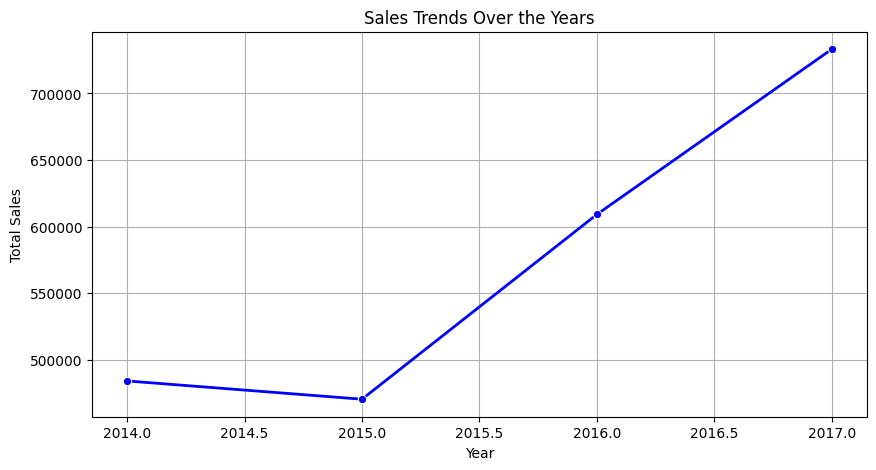

In [10]:
plt.figure(figsize=(10, 5))

# Plot sales trends
sns.lineplot(x='Year', y='Sales', data=yearly_sales, marker='o', color='blue', linewidth=2)

plt.xlabel("Year")
plt.ylabel("Total Sales")
plt.title("Sales Trends Over the Years")
plt.grid(True)

plt.show()


<ipython-input-12-800d279b8727>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Sales', y='Country', data=country_sales, palette='Blues_r')


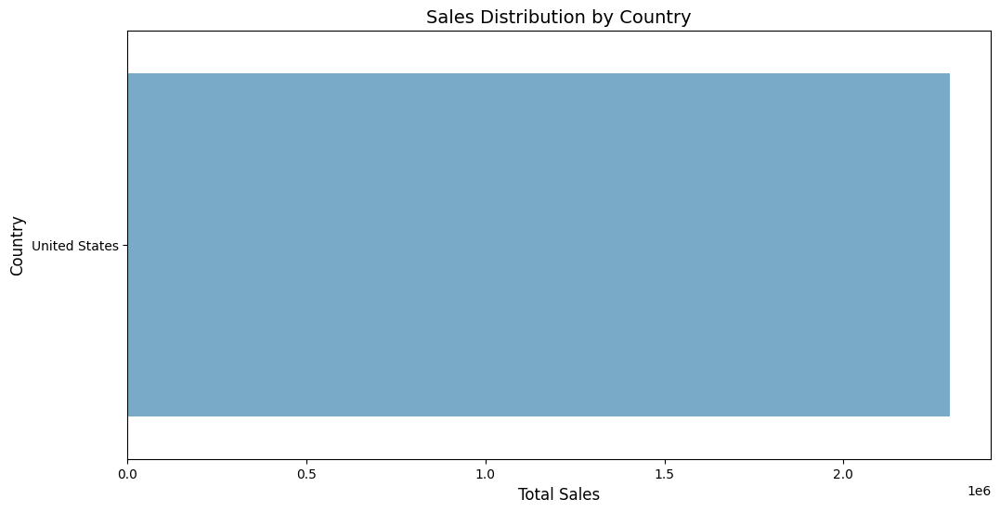

In [12]:
# Build an interactive map to visualize sales distribution by country. (THERE4S US ONLY????)

# To group sales by country
country_sales = data.groupby('Country', as_index=False)['Sales'].sum()

# Sort by sales in descending order
country_sales = country_sales.sort_values(by='Sales', ascending=False)

plt.figure(figsize=(12, 6))

# Plot sales by country
sns.barplot(x='Sales', y='Country', data=country_sales, palette='Blues_r')

plt.title("Sales Distribution by Country", fontsize=14)
plt.xlabel("Total Sales", fontsize=12)
plt.ylabel("Country", fontsize=12)

plt.show()

In [14]:
print(data['Country'].unique())

['United States']


In [15]:
# 3. Data Visualization with Seaborn:
# Use Seaborn to generate a bar chart showing top 10 products by sales.

top_products = data.groupby("Product Name", as_index=False)["Sales"].sum()

# top 10 products
top_products = top_products.sort_values(by="Sales", ascending=False).head(10)

<ipython-input-16-9edbb4df2369>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Sales", y="Product Name", data=top_products, palette="Blues_r")


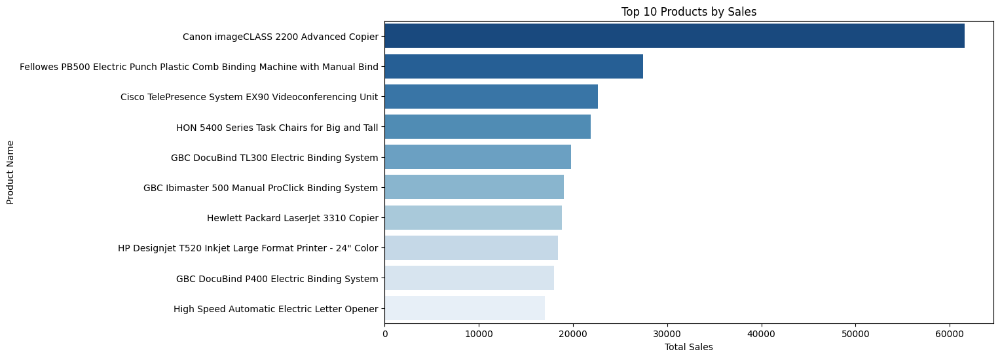

In [16]:
plt.figure(figsize=(12, 6))
sns.barplot(x="Sales", y="Product Name", data=top_products, palette="Blues_r")

plt.xlabel("Total Sales")
plt.ylabel("Product Name")
plt.title("Top 10 Products by Sales")
plt.show()

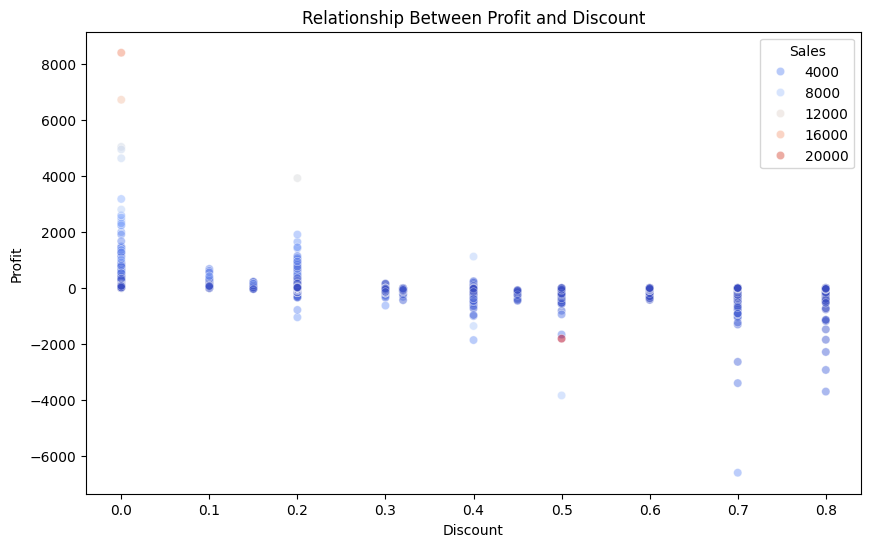

In [17]:
# Create a scatter plot to analyze the relationship between profit and discount.

plt.figure(figsize=(10, 6))

# Scatter plot
sns.scatterplot(x="Discount", y="Profit", data=data, alpha=0.5, hue="Sales", palette="coolwarm")

plt.xlabel("Discount")
plt.ylabel("Profit")
plt.title("Relationship Between Profit and Discount")

plt.show()

4. Comparative Analysis:

Matplotlib provides a high level of control over visualizations, making it highly customizable but sometimes verbose. It is best suited for basic plots and detailed modifications, though achieving aesthetic appeal often requires additional styling.

Seaborn, on the other hand, simplifies visualization with built-in themes and functions tailored for statistical analysis. It allows for quick and visually appealing plots with minimal code. While it may not offer the same level of fine-tuned customization as Matplotlib, it is more effective for exploratory data analysis.

Overall, Seaborn is easier to use for quick insights, while Matplotlib remains powerful for detailed and customized visualizations.







